In [1]:
#add necessary libraries
import networkx as nx #library supporting networks
import matplotlib.pyplot as plt #plotting
import pandas as pd
import numpy as np
import scipy.stats as stat
#make sure plots are embedded into the notebook
%pylab inline
import statsmodels.formula.api as smf
import pandas as pd
import geopandas as gpd
import numpy as np
import os
import urllib
import sys
import seaborn as sns
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn import preprocessing
import urllib
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
import geopandas as gpd
import pyogrio
import matplotlib.colors as colors
import matplotlib.cm as cm
import folium
import json
import altair as alt

# To ignore some warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


### Data Loading:

In [2]:
#station list
Stations = pd.read_csv( 'https://raw.githubusercontent.com/CUSP2021ADS/Data/main/NYCSubwayNodes.csv' , index_col=None, header=0 )
Stations.head()

,name,id,boro,lat,long,lines
0,Greenpoint Av,G26,Bk,40.731352,-73.954449,G
1,21 St,G24,Q,40.744065,-73.949724,G
2,Court Sq,G22,Q,40.746554,-73.943832,G
3,36 St,G20,Q,40.752039,-73.928781,M R
4,Queens Plaza,G21,Q,40.748973,-73.937243,E M R


In [3]:
#connection list
Links = pd.read_csv( 'https://raw.githubusercontent.com/CUSP2021ADS/Data/main/NYCSubwayEdges.csv' , index_col=None, header=0 )
Links.head()

,origin,dest
0,G26,G24
1,G26,G28
2,G24,G26
3,G24,G22
4,G22,G24


In [4]:
# NYC shape file w/ population by zipcode:
zippop = gpd.read_file('https://data.cityofnewyork.us/api/geospatial/pri4-ifjk?date=20231207&accessType=DOWNLOAD&method=export&format=Shapefile')

### Processing:

In [5]:
#create a dictionary of subway stations by name and location
StPos={Stations.id[c]:(Stations.long[c],Stations.lat[c]) for c in Stations.index}
StName={Stations.id[c]:Stations.name[c] for c in Stations.index}

In [6]:
#creare a directed graph subway network
NYCSubway=nx.DiGraph()
for i in Links.index:
    NYCSubway.add_edge(Links.origin[i],Links.dest[i])

In [7]:
station_lat = Stations.set_index('id')['lat'].to_dict()  
station_long = Stations.set_index('id')['long'].to_dict()

# Copy Links DataFrame for safety
Links_co = Links.copy()

# Map latitude and longitude for origin and destination using the created dictionaries
Links_co['origin_lat'] = Links_co['origin'].map(station_lat)
Links_co['origin_long'] = Links_co['origin'].map(station_long)
Links_co['dest_lat'] = Links_co['dest'].map(station_lat)
Links_co['dest_long'] = Links_co['dest'].map(station_long)

### Original Graph that shows the stations and connections without any weighting:

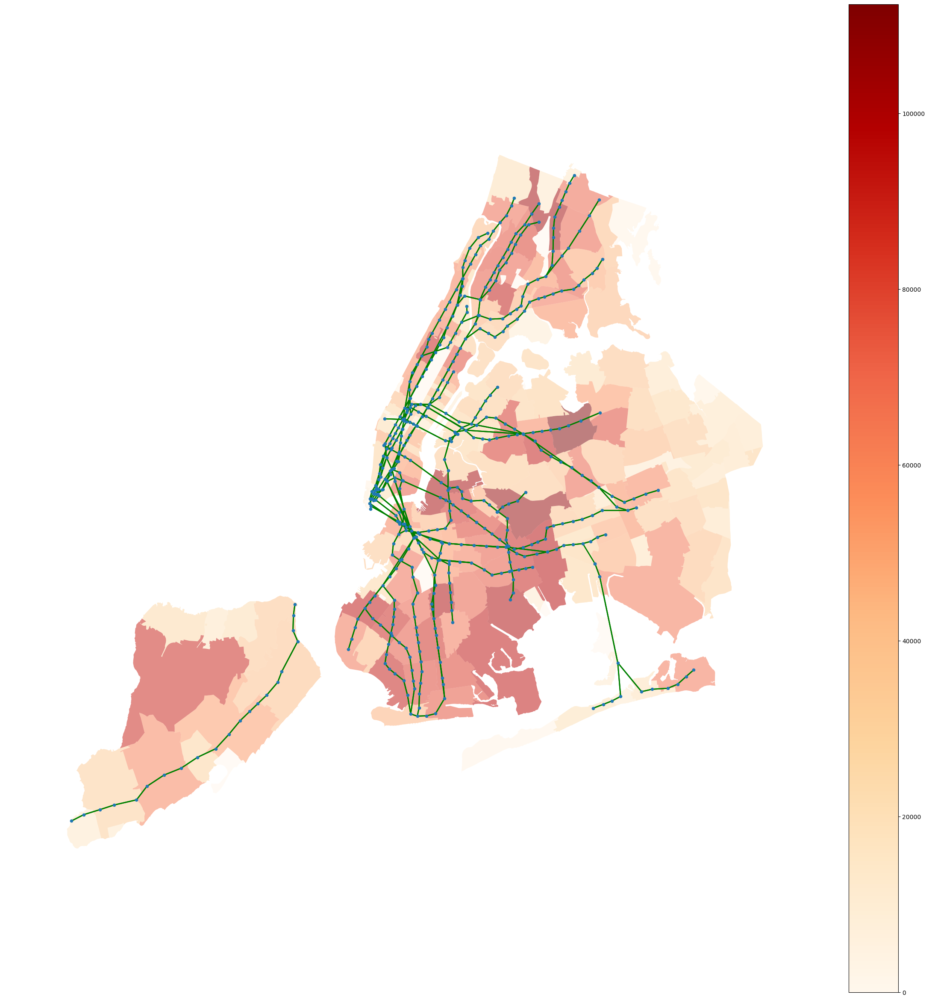

In [8]:
fig, ax = plt.subplots(figsize=(30, 30))
zippop.plot(column='pop_est', legend=True, cmap='OrRd', ax=ax, alpha=0.5)

nx.draw(NYCSubway,pos=StPos,with_labels=False,arrows=False,node_size=20,width=2,edge_color='green')

plt.show()


### Find out the centrality of each stations:

In [9]:
#output top tn centrality scores, given the dictionary d
def topdict(d,tn):
    ind=sorted(d, key=d.get, reverse=True)
    result = []
    for i in range(tn):  # Loop to collect top tn nodes
        result.append((ind[i], d[ind[i]]))  # Append the node and its PageRank score as a tuple
    # Create a DataFrame from the list of tuples
    df = pd.DataFrame(result, columns=['Node', 'centrality'])

    return df  # Return the DataFrame


### Find out the degree of each node by the centrlity definition above:

In [10]:
mc1=dict(nx.degree(NYCSubway))
ind1=topdict(mc1,494)

In [11]:
deg = dict(ind1.values)

In [12]:
Stations['degree'] = Stations['id'].map(deg)

Try to visualiza by plt:

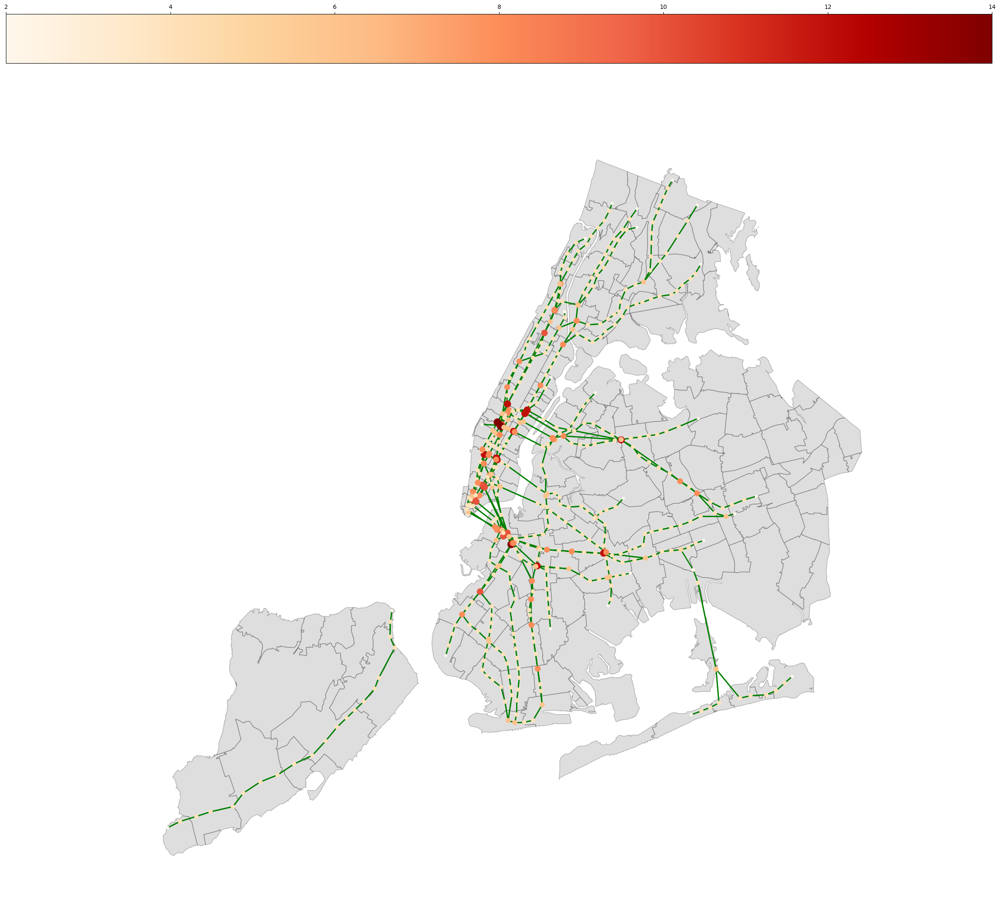

In [13]:
fig, ax = plt.subplots(figsize=(30, 30))

# get rid of color peth of the map, and show the boundarys
zippop.plot(legend=True, ax=ax,color = 'gray',edgecolor='black', alpha=0.26)
# Normalize the color map for nodes, with the maximum value of degree in deep red and minimum in light red.
norm = colors.Normalize(vmin=min(deg.values()), vmax=max(deg.values()))

nx.draw(NYCSubway,pos=StPos,with_labels=False,arrows=False,
        node_size=[deg.get(node, 0) * 10 for node in NYCSubway.nodes()], 
        node_color=[plt.cm.OrRd(norm(deg[node]))for node in NYCSubway.nodes()],
        width=2,edge_color='green')

sm = cm.ScalarMappable(cmap=plt.cm.OrRd, norm=norm)
plt.colorbar(sm, ax=ax,orientation='horizontal', location='top')
plt.show()

Dose not tells the stations and lines infos.

Try visualize by the altair package:

In [14]:
zippop_json = json.loads(zippop.to_json())
zippop_data = alt.Data(values=zippop_json['features'])


select_station = alt.selection_single(
    on='mouseover',  
    nearest=True,    
    fields=['origin'],   
    empty='none'    
)


lookup_data = alt.LookupData(
    Stations, key="id", fields=["name", "lat", "long"]
)


connections = alt.Chart(Links_co).mark_rule(opacity=1, color='green').encode(
    latitude="origin_lat:Q",
    longitude="origin_long:Q",
    latitude2="dest_lat:Q",
    longitude2="dest_long:Q"
).transform_lookup(
    lookup="origin",
    from_=lookup_data
).transform_lookup(
    lookup="dest",
    from_=lookup_data,
    as_=[ "name","dest_lat", "dest_long"]
)


points = alt.Chart(Stations).mark_circle().encode(
    longitude='long:Q',
    latitude='lat:Q',
    tooltip=['name:N','lines', 'degree:Q'], 
    size=alt.Size('degree:Q', title='Station Degree')
).transform_filter(
    (alt.datum.state != "PR") & (alt.datum.state != "VI")
).add_selection(
    select_station
)


# Combine the charts
chart =connections+ points

background = alt.Chart(zippop_data).mark_geoshape(
    fill='lightgray',
    stroke='black'
).properties(
    width=800,
    height=800
).project('identity', reflectY=True)

final_chart = background + chart
final_chart.configure_view(stroke=None)


alt.LayerChart(...)

Tells the infos for each stations, infos appears by mouseover and tooltip functions. But points kind of stack over together, not able to tell the stations.

Try to visualiza by folium:

In [15]:
# Create a map centered around Times Square
m = folium.Map(location=[40.755290, -73.987495], zoom_start=13)

# Define a colormap
cmap = cm.get_cmap('OrRd')
# Define range of colormap
norm = colors.Normalize(vmin=min(deg.values()), vmax=max(deg.values()))

# Add lines for connections
for index, row in Links_co.iterrows():
    points = [[row['origin_lat'], row['origin_long']], [row['dest_lat'], row['dest_long']]]
    folium.PolyLine(
        locations=points,
        color='green',
        weight=2,
        opacity=0.3,
    ).add_to(m)

# Add markers or circles for stations
for index, row in Stations.iterrows():
    # Convert the degree to a color directly within the loop
    rgba = cmap(norm(row['degree']))  # Get RGBA value from colormap
    color = matplotlib.colors.rgb2hex(rgba)  # Convert RGBA to hex format

    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=row['degree'],  # Scale factor for visualization
        tooltip=f"{row['name']} | Line:{row['lines']} | Degree: {row['degree']}",
        fill=True,
        color=False,  # Use the colormap for the border
        fill_color=color,  # Fill color based on the degree
        fill_opacity=0.7
    ).add_to(m)

# Display the map
m


/var/folders/qp/9y56mfxx3zq2c_cjbvf9xg_w0000gn/T/ipykernel_16528/3488750529.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('OrRd')


### Find out the Betweenness of each node by the centrlity definition above:

In [16]:
mc2=dict(nx.betweenness_centrality(NYCSubway))
ind2=topdict(mc2,494)

In [17]:
btw = dict(ind2.values)

In [18]:
Stations['Betweenness'] = Stations['id'].map(btw)

In [19]:
# Create a map centered around Times Square
m = folium.Map(location=[40.755290, -73.987495], zoom_start=13)

# Define a colormap
cmap = cm.get_cmap('OrRd') 
#define the range 
norm = colors.Normalize(vmin=min(btw.values()), vmax=max(btw.values()))

# Add lines for connections
for index, row in Links_co.iterrows():
    points = [[row['origin_lat'], row['origin_long']], [row['dest_lat'], row['dest_long']]]
    folium.PolyLine(
        locations=points,
        color='green',
        weight=2,
        opacity=0.3,
    ).add_to(m)

# Add markers or circles for stations
for index, row in Stations.iterrows():
    # Convert the degree to a color directly within the loop
    rgba = cmap(norm(row['Betweenness']))  # Get RGBA value from colormap
    color = matplotlib.colors.rgb2hex(rgba)  # Convert RGBA to hex format

    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=row['Betweenness']*50,  # Scale factor for visualization
        tooltip=f"{row['name']} | Line:{row['lines']} | Betweenness: {row['Betweenness']}",
        fill=True,
        color=False,  # Use the colormap for the border
        fill_color=color,  # Fill color based on the degree
        fill_opacity=0.7
    ).add_to(m)

# Display the map
m

/var/folders/qp/9y56mfxx3zq2c_cjbvf9xg_w0000gn/T/ipykernel_16528/448365082.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('OrRd')


### Find out the Closeness of each node by the centrlity definition above:

In [20]:
mc3=dict(nx.closeness_centrality(NYCSubway))
ind3=topdict(mc3,494)
cls = dict(ind3.values)

In [21]:
Stations['closeness'] = Stations['id'].map(cls)

In [22]:
# Create a map centered around Times Square
m = folium.Map(location=[40.755290, -73.987495], zoom_start=13)

# Define a colormap
cmap = cm.get_cmap('OrRd') 
#define the range 
norm = colors.Normalize(vmin=min(cls.values()), vmax=max(cls.values()))

# Add lines for connections
for index, row in Links_co.iterrows():
    points = [[row['origin_lat'], row['origin_long']], [row['dest_lat'], row['dest_long']]]
    folium.PolyLine(
        locations=points,
        color='green',
        weight=2,
        opacity=0.3,
    ).add_to(m)

# Add markers or circles for stations
for index, row in Stations.iterrows():
    # Convert the degree to a color directly within the loop
    rgba = cmap(norm(row['closeness']))  # Get RGBA value from colormap
    color = matplotlib.colors.rgb2hex(rgba)  # Convert RGBA to hex format

    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=row['closeness']*60,  # Scale factor for visualization
        tooltip=f"{row['name']} | Line:{row['lines']} | closeness: {row['closeness']}",
        fill=True,
        color=False,  # Use the colormap for the border
        fill_color=color,  # Fill color based on the degree
        fill_opacity=0.7
    ).add_to(m)

# Display the map
m

/var/folders/qp/9y56mfxx3zq2c_cjbvf9xg_w0000gn/T/ipykernel_16528/2626795558.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('OrRd')
